# 
<div align="center", style="font-size:240%">
                <font color="#EA1515">
                    <b>  Regression with a Tabular Media Campaign Cost Dataset

---
---

## PROBLEM STATEMENT :
---
- The dataset for this competition (both train and test) was generated from a deep learning model trained on the Media Campaign Cost Prediction dataset. Feature distributions are close to, but not exactly the same, as the original.
- Food Mart (CFM) is a chain of convenience stores in the United States. The private company's headquarters are located in Mentor, Ohio, and currently, approximately 325 stores are located in the US. Convenient Food Mart operates on the franchise system.
- Food Mart was the nation's third-largest chain of convenience stores as of 1988.
- The NASDAQ exchange dropped Convenient Food Mart the same year when the company failed to meet financial reporting requirements.
- Carden & Cherry advertised Convenient Food Mart with the Ernest character in the 1980s.
- Your Task is to devise a Machine Learning Model that helps us predict the cost of media campaigns in the food marts on the basis of the features provided.
## EVALUATION CRITERIA :
---

- root mean squared log error (RMSLE)

## COLUMNS :
---

- store_sales(in millions) - store_sales(in million dollars)
- unit_sales(in millions) - unit_sales(in millions) in stores Quantity
- Total_children - TOTAL CHILDREN IN HOME
- avg_cars_at home(approx) - avg_cars_at home(approx)
- Num_children_at_home - num_children_at_home AS PER CUSTOMERS FILLED DETAILS
- Gross_weight - gross_weight OF ITEM
- Recyclable_package - FOOD ITEM IS recyclable_package
- Low_fat - LOW_FAT FOOD ITEM IS LOW FAT
- Units_per_case - UNITS/CASE UNITS AVAILABLE IN EACH STORE SHELVES
- Store_sqft - STORE AREA AVAILABLE IN SQFT
- Coffee_bar - COFFEE BAR available in store
- Video_store - VIDEO STORE/gaming store available
- Salad_bar - SALAD BAR available in store
- Prepared_food - food prepared available in store
- Florist - flower shelves available in store
- Cost - COST ON ACQUIRING A CUSTOMERS in dollars   -------- Target

##### 
<div align="left", style="font-size:150%">
                <font color="#151EDA">
                    <b>  IMPORTING BASIC LIBRARIES

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import warnings
warnings.simplefilter("ignore")

##### 
<div align="left", style="font-size:150%">
                <font color="#151EDA">
                    <b>  IMPORTING THE FILES AND RUNNING THE HEAD

In [2]:
train = pd.read_csv("train.csv")
test  = pd.read_csv("test.csv")
sub   = pd.read_csv(r"submission.csv")
df    = pd.concat((train,test),ignore_index=True)
df.head()

,id,store_sales(in millions),unit_sales(in millions),total_children,num_children_at_home,avg_cars_at home(approx).1,gross_weight,recyclable_package,low_fat,units_per_case,store_sqft,coffee_bar,video_store,salad_bar,prepared_food,florist,cost
0,0,8.61,3.0,2.0,2.0,2.0,10.30,1.0,0.0,32.0,36509.0,0.0,0.0,0.0,0.0,0.0,62.09
1,1,5.00,2.0,4.0,0.0,3.0,6.66,1.0,0.0,1.0,28206.0,1.0,0.0,0.0,0.0,0.0,121.80
2,2,14.08,4.0,0.0,0.0,3.0,21.30,1.0,0.0,26.0,21215.0,1.0,0.0,0.0,0.0,0.0,83.51
3,3,4.02,3.0,5.0,0.0,0.0,14.80,0.0,1.0,36.0,21215.0,1.0,0.0,0.0,0.0,0.0,66.78
4,4,2.13,3.0,5.0,0.0,3.0,17.00,1.0,1.0,20.0,27694.0,1.0,1.0,1.0,1.0,1.0,111.51


##### 
<div align="left", style="font-size:150%">
                <font color="#151EDA">
                    <b> RUNNING THE INFO AND CHECKING SHAPE

In [3]:
print(df.info(),'\n',df.shape)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 600560 entries, 0 to 600559
Data columns (total 17 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   id                          600560 non-null  int64  
 1   store_sales(in millions)    600560 non-null  float64
 2   unit_sales(in millions)     600560 non-null  float64
 3   total_children              600560 non-null  float64
 4   num_children_at_home        600560 non-null  float64
 5   avg_cars_at home(approx).1  600560 non-null  float64
 6   gross_weight                600560 non-null  float64
 7   recyclable_package          600560 non-null  float64
 8   low_fat                     600560 non-null  float64
 9   units_per_case              600560 non-null  float64
 10  store_sqft                  600560 non-null  float64
 11  coffee_bar                  600560 non-null  float64
 12  video_store                 600560 non-null  float64
 13  salad_bar     

##### 
<div align="left", style="font-size:150%">
                <font color="#151EDA">
                    <b> RUNNING FIVE POINT SUMMARY

In [4]:
df.describe(include='all').T

,count,mean,std,min,25%,50%,75%,max
id,600560.0,300279.500000,173366.883169,0.00,150139.75,300279.50,450419.25,600559.00
store_sales(in millions),600560.0,6.343951,3.307756,0.51,3.74,5.79,8.40,22.92
unit_sales(in millions),600560.0,3.043901,0.783998,1.00,3.00,3.00,4.00,6.00
total_children,600560.0,2.455505,1.488361,0.00,1.00,2.00,4.00,5.00
num_children_at_home,600560.0,0.687786,1.213388,0.00,0.00,0.00,1.00,5.00
avg_cars_at home(approx).1,600560.0,2.201557,1.084630,0.00,1.00,2.00,3.00,4.00
gross_weight,600560.0,13.824595,4.618258,6.00,9.71,13.60,17.70,21.90
recyclable_package,600560.0,0.567151,0.495471,0.00,0.00,1.00,1.00,1.00
low_fat,600560.0,0.327449,0.469283,0.00,0.00,0.00,1.00,1.00
units_per_case,600560.0,18.967597,10.214229,1.00,10.00,20.00,28.00,36.00


##### 
<div align="left", style="font-size:150%">
                <font color="#151EDA">
                    <b> TARGET VARIABLE

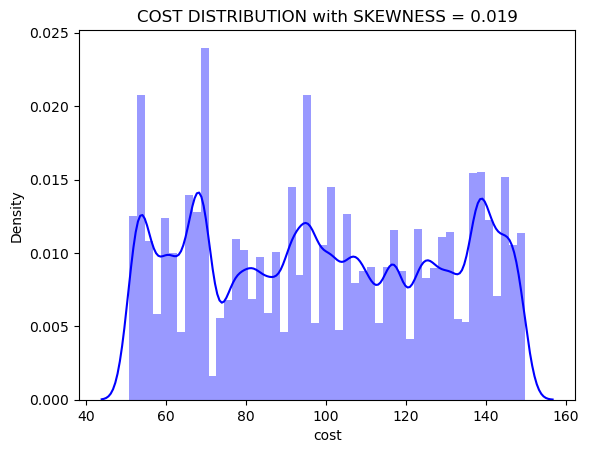

In [5]:
sns.distplot(df.cost,color='blue')
plt.title('COST DISTRIBUTION with SKEWNESS = %.3f'%(df.cost.skew()))
plt.show()

# DISTRIBUTED UNIFORMALLY

##### 
<div align="left", style="font-size:150%">
                <font color="#151EDA">
                    <b> CHECKING PERCENTAGE OF CATEGORIES IN CATEGORICAL COLUMN

In [6]:
num_cols = df.select_dtypes(np.number).columns.to_list()
cat_cols = df.select_dtypes(object).columns.to_list()

In [7]:
for i in cat_cols:
    print(i,' ----------> ',df[i].nunique())

# INITIALLY THERE ARE NO CATEGORICAL DATA TYPE COLUMNS

##### 
<div align="center", style="font-size:250%">
                <font color="8F15DA">
                    <b> UNIVARIATE ANALYSIS

---

In [8]:
plt.figure(figsize=(30,14),dpi=600)
j = 1
for i in num_cols+cat_cols:
    plt.subplot(4,5,j)
    if i in num_cols:
        sns.distplot(df[i],color='blue')
        plt.title('SKEWNESS = %.3f'%(df[i].skew()))
    else:
        sns.countplot(df[i],palette=['blue','purple','violet','indigo'])
    j+=1
plt.tight_layout()
plt.show()

##### 
<div align="center", style="font-size:250%">
                <font color="8F15DA">
                    <b> BIVARIATE ANALYSIS

---

In [9]:
plt.figure(figsize=(30,14),dpi=600)
j = 1
for i in num_cols+cat_cols:
    plt.subplot(4,5,j)
    if i in num_cols:
        sns.scatterplot(df[i],df.cost,color='blue')
    else:
        sns.boxplot(df[i],df.cost,palette=['blue','purple'])
    j+=1
plt.tight_layout()
plt.show()

In [10]:
cat = ['recyclable_package', 'low_fat', 'salad_bar', 'prepared_food', 'coffee_bar', 'video_store', 'florist']

num = ['id', 'store_sales(in millions)', 'unit_sales(in millions)', 'total_children', 'num_children_at_home',
 'avg_cars_at home(approx).1', 'gross_weight', 'units_per_case',
 'store_sqft', 'cost']

print("Categorical Variables :\n----------------------\n\n",cat,'\n\n')
print("Numerical   Variables :\n----------------------\n\n",num,'\n')

Categorical Variables :
----------------------

 ['recyclable_package', 'low_fat', 'salad_bar', 'prepared_food', 'coffee_bar', 'video_store', 'florist'] 


Numerical   Variables :
----------------------

 ['id', 'store_sales(in millions)', 'unit_sales(in millions)', 'total_children', 'num_children_at_home', 'avg_cars_at home(approx).1', 'gross_weight', 'units_per_case', 'store_sqft', 'cost'] 



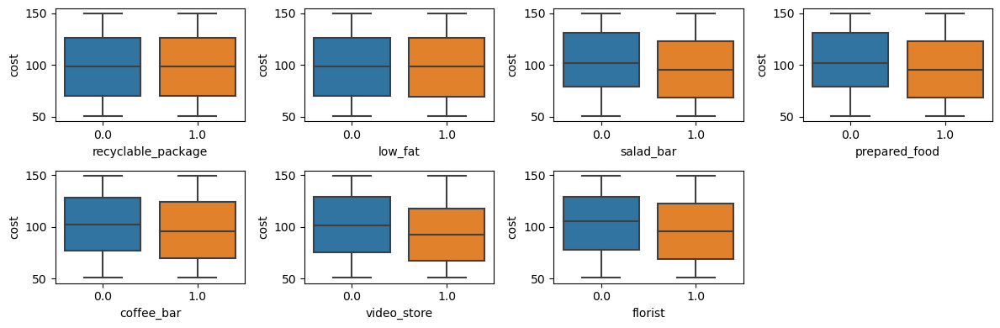

In [11]:
j=1
plt.figure(figsize=(12,4))
for i in cat:
    plt.subplot(2,4,j)
    sns.boxplot(df[i],df.cost)
    j+=1
plt.tight_layout()
plt.show()

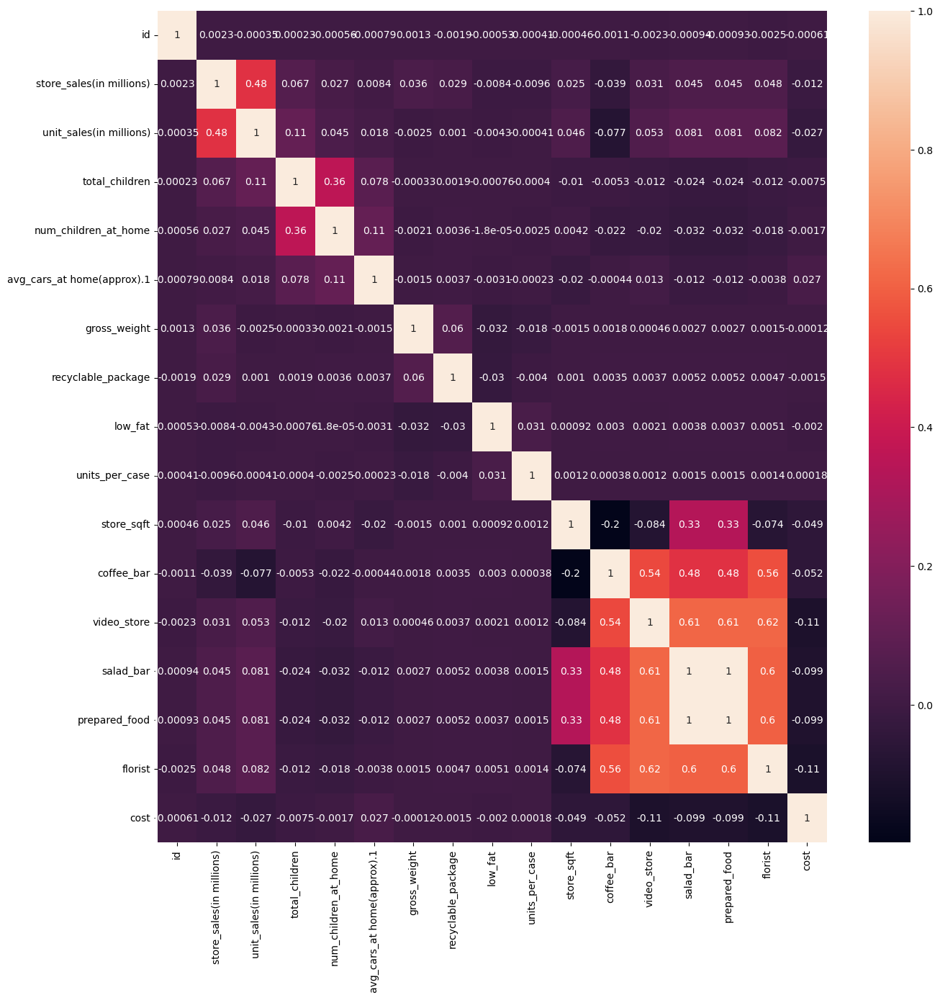

In [12]:
# MULTIVARIATE ANALYSIS

plt.figure(figsize=(15,15))
sns.heatmap(df.corr(),annot=True)
plt.show()

##### 
<div align="left", style="font-size:150%">
                <font color="#151EDA">
                    <b> AS PER THE VISUAL ANALYSIS


### Vizual analysis summary

• The target column cost is uniformally distributed.

• salad_bar, prepared_food appear to have same relation with cost so we will drop one of them from further analysis

• recyclable package doesn't appear to have a strong relation with the target so we will verify it statistically

• stores having area aroud 30000 square feet appear to have more dense scatters meaning more footfalls.

##### 
<div align="center", style="font-size:250%">
                <font color="8F15DA">
                    <b> MISSING VALUES

---

In [13]:
print(df.isnull().sum())

# THERE ARE NO MISSING VALUES

id                                 0
store_sales(in millions)           0
unit_sales(in millions)            0
total_children                     0
num_children_at_home               0
avg_cars_at home(approx).1         0
gross_weight                       0
recyclable_package                 0
low_fat                            0
units_per_case                     0
store_sqft                         0
coffee_bar                         0
video_store                        0
salad_bar                          0
prepared_food                      0
florist                            0
cost                          240224
dtype: int64


##### 
<div align="center", style="font-size:250%">
                <font color="8F15DA">
                    <b> FEATURE ENGINEERING AND FEATURE MANIPULATION

---

In [14]:
for i in cat:
    df[i] = df[i].astype('O')

In [15]:
df.drop(columns = ['id','prepared_food'],inplace=True)

In [16]:
df['Total_Units_Sold'] = df['unit_sales(in millions)']/df['store_sales(in millions)']
del df['unit_sales(in millions)']

##### 
<div align="center", style="font-size:250%">
                <font color="8F15DA">
                    <b> STATISTICAL ANALYSIS

---

##### 
<div align="left", style="font-size:150%">
                <font color="#151EDA">
                    <b> APPLYING TESTS

In [17]:
li = []
for i in df:
    if i !='cost':
        if df[i].dtype != object:
            d_stat = df.dropna()
            if round(stats.mannwhitneyu(d_stat[i],d_stat.cost)[1],3)<0.05:
                li.append(i)
        else:
            a = df[(df[i]==0.0) & (df.cost.notnull())]['cost']
            b = df[(df[i]==1.0) & (df.cost.notnull())]['cost']
            if round(stats.mannwhitneyu(a,b)[1],3)<0.05:
                li.append(i)
del d_stat
print('Significant Columns :\n',li)

Significant Columns :
 ['store_sales(in millions)', 'total_children', 'num_children_at_home', 'avg_cars_at home(approx).1', 'gross_weight', 'units_per_case', 'store_sqft', 'coffee_bar', 'video_store', 'salad_bar', 'florist', 'Total_Units_Sold']


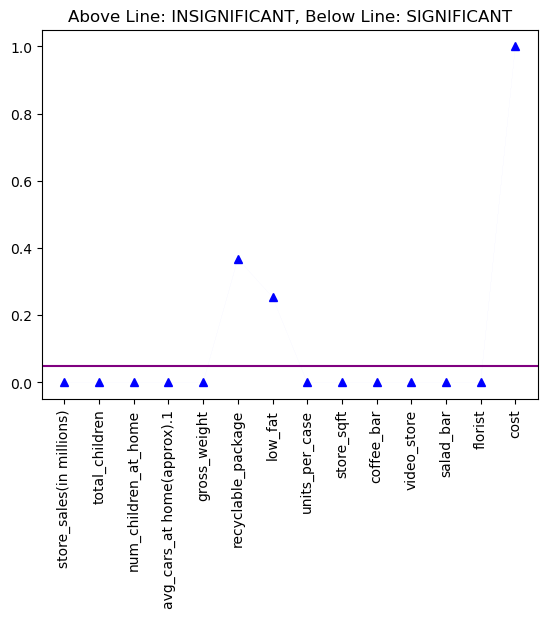

In [18]:
p = []
for i in df.columns[:-1]:
        if df[i].dtype != object:
            d_stat = df.dropna()
            p.append(round(stats.mannwhitneyu(d_stat[i],d_stat.cost)[1],3))
        else:
            a = df[(df[i]==0.0) & (df.cost.notnull())]['cost']
            b = df[(df[i]==1.0) & (df.cost.notnull())]['cost']
            p.append(round(stats.mannwhitneyu(a,b)[1],3))
plt.plot(df.columns[:-1],p,color='blue',marker='^',lw=0.01)
plt.xticks(rotation=90)
plt.title('Above Line: INSIGNIFICANT, Below Line: SIGNIFICANT')
plt.axhline(y=0.05,color='purple')
plt.show()

In [19]:
# Dropping insignificant columns

df.drop(columns=["recyclable_package","low_fat"],inplace=True)

##### 
<div align="center", style="font-size:250%">
                <font color="8F15DA">
                    <b> DATA PREPROCESSING

---

##### 
<div align="left", style="font-size:150%">
                <font color="#151EDA">
                    <b> SPLITTING THE DATA INTO TRAIN AND TEST

In [20]:
train = df[df.cost.notnull()]
test  = df[df.cost.isnull()].drop('cost',axis=1)
X = train.drop('cost',axis=1)
y = train.cost

##### 
<div align="left", style="font-size:150%">
                <font color="#151EDA">
                    <b> SCALING THE NUMERICAL DATA AND ENCODING CATEGORICAL DATA

In [21]:
from sklearn.preprocessing import power_transform
for i in X.select_dtypes(np.number):
    X[i] = power_transform(pd.DataFrame(X[i]))
    test[i] = power_transform(pd.DataFrame(test[i]))

In [22]:
for i in X.select_dtypes('O'):
    X[i] = X[i].astype(np.number)
    test[i] = test[i].astype(np.number)

##### 
<div align="center", style="font-size:250%">
                <font color="8F15DA">
                    <b> MODELLING

---

##### 
<div align="left", style="font-size:150%">
                <font color="#151EDA">
                    <b> IMPORTING THE LIBRARIES AND FUNCTIONS

In [23]:
from sklearn.linear_model import LinearRegression,Ridge,Lasso
from sklearn.tree import DecisionTreeRegressor,plot_tree
from sklearn.ensemble import RandomForestRegressor,AdaBoostRegressor,GradientBoostingRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_log_error
from sklearn.model_selection import cross_val_score,KFold

##### 
<div align="left", style="font-size:140%">
                <font color="#151EDA">
                    <b> CROSS VALIDATING THE MODELS USING STRATIFIED KFOLD CROSS VALIDATION AND EVALUATING

In [24]:
# CREATING MACHINE INSTANCE

lr  = LinearRegression()
rg  = Ridge()
la = Lasso()
dt  = DecisionTreeRegressor()
rf  = RandomForestRegressor()
xg  = XGBRegressor()
ca  = CatBoostRegressor(verbose=0)
ad  = AdaBoostRegressor()
gb  = GradientBoostingRegressor()
lg  = LGBMRegressor()
knn = KNeighborsRegressor(n_neighbors=3)

In [25]:
cv = KFold(n_splits=5,shuffle=True)

for m in [lr,rg,la,dt,xg,ca,ad,gb,lg,knn]:
    print('\t\t',m,'\n')
    for i,j in cv.split(X,y):
        xtr,xte,ytr,yte = X.loc[i],X.loc[j],y[i],y[j]
        model = m.fit(xtr,ytr)
        pred_tr,pred_te = model.predict(xtr),model.predict(xte)
        print(round(np.sqrt(mean_squared_log_error(ytr,pred_tr)),4),' , ',round(np.sqrt(mean_squared_log_error(yte,pred_te)),4))
    print('\n')

		 LinearRegression() 

0.3168  ,  0.3165
0.3169  ,  0.3174
0.3169  ,  0.3167
0.3167  ,  0.317
0.3169  ,  0.3167


		 Ridge() 

0.3169  ,  0.3164
0.3166  ,  0.3179
0.3169  ,  0.3164
0.3168  ,  0.317
0.3169  ,  0.3166


		 Lasso() 

0.3185  ,  0.3186
0.3185  ,  0.3187
0.3184  ,  0.3196
0.3187  ,  0.3178
0.3186  ,  0.3179


		 DecisionTreeRegressor() 

0.0147  ,  0.4209
0.014  ,  0.4177
0.014  ,  0.4189
0.0142  ,  0.4194
0.0144  ,  0.4181


		 XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
          

In [26]:
# BASE PERFORMANCE WAS COMING BEST WITH XGBOOST REGRESSOR SO WE WILL USE IT AS OUR FINAL MODEL.
# (Tuning is crashing the system)

In [27]:
# FINAL MODEL

model = xg.fit(X,y)

In [28]:
sub['cost'] = model.predict(test)
sub.to_csv('xgboost.csv',index=False)

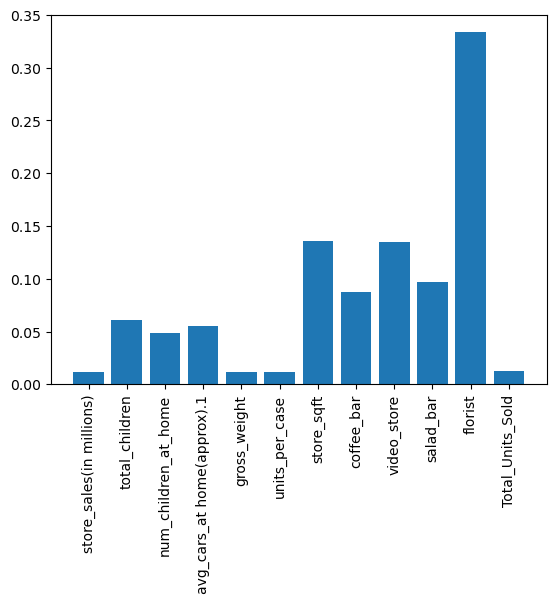

In [29]:
plt.bar(X.columns,xg.feature_importances_)
plt.xticks(rotation=90)
plt.show()

In [30]:
# As per the model, most of importance is given to florist, area of store and total children in the family., whereas store sales
# is not a very significant dicider of cost of store.

In [31]:
# 0.3013
# FINAL SCORE ON KAGGLE